<a href="https://colab.research.google.com/github/lookmeebbear/Geoimg_SVCU/blob/main/MIST_yokky_textureRGB.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**Texture Analysis for UAV RGB Image Classification**

For Kritera Tankitiyanon, Senior Project 2024 Student






______________________________________________________________________
Thepchai Srinoi, Lecturer

MHEE Research Unit

Mapping and Highway Engineering and Entertainment Research Unit

Department of Survey Engineering

Chulalongkorn University

In [ ]:
# https://drive.google.com/file/d/1Cg0ybqoC1KeDetQPBTwtrvwLHmgoDRxl/view?usp=sharing

!gdown https://drive.google.com/uc?id=1Cg0ybqoC1KeDetQPBTwtrvwLHmgoDRxl

Downloading...
From: https://drive.google.com/uc?id=1Cg0ybqoC1KeDetQPBTwtrvwLHmgoDRxl
To: /content/yokky_texture_demo.zip
100% 5.22M/5.22M [00:00<00:00, 44.1MB/s]


In [ ]:
!unzip /content/yokky_texture_demo.zip

Archive:  /content/yokky_texture_demo.zip
  inflating: yokky_crop1.tif         
  inflating: yokky_sample.csv        


Open Image First !!!!!

In [ ]:
!pip install rasterio

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.2/22.2 MB 50.6 MB/s eta 0:00:00


In [ ]:
import rasterio as rio
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix,classification_report
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split

from skimage import exposure, io
from skimage.segmentation import quickshift, mark_boundaries, felzenszwalb, slic
from __future__ import print_function

In [ ]:
img = io.imread( '/content/yokky_crop1.tif' )
type( img )
print( img.shape  )

(954, 2208, 4)


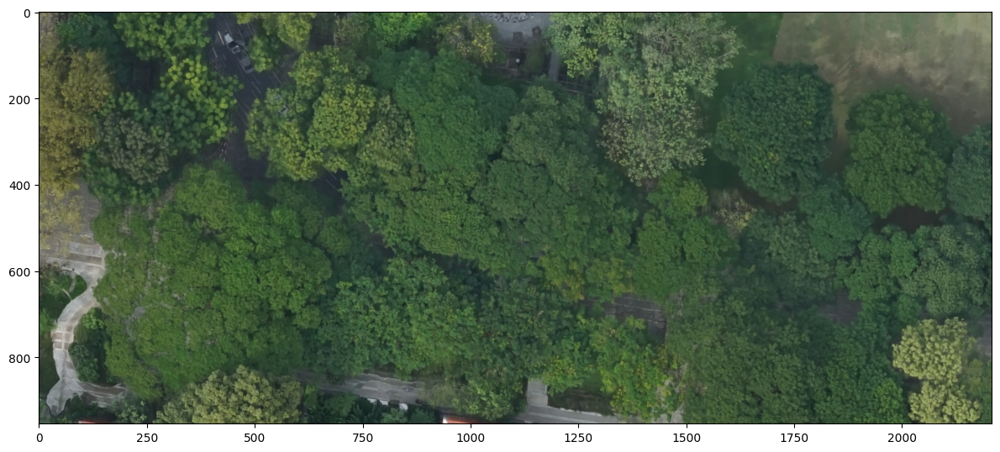

In [ ]:
from matplotlib import colors
fig = plt.figure(figsize=(12, 24))

ax = fig.add_subplot(2, 1, 1)
ax.imshow(img[:,:,:3], vmin=0, vmax=255)

plt.tight_layout()
plt.show()

In [ ]:
IMG = rio.open('yokky_crop1.tif')

Try to classify RGB Image .. Welcome to the ซึมเศร้า crisis

In [ ]:
df = pd.read_csv('/content/yokky_sample.csv')
df

,Y,X,label
0,1519270.021,665495.4271,0
1,1519271.398,665453.2102,0
2,1519243.751,665420.4003,0
3,1519261.360,665461.7568,0
4,1519240.079,665517.1666,1
5,1519270.652,665437.5509,1
6,1519266.637,665430.7251,1
7,1519266.637,665444.3194,1
8,1519257.463,665503.6414,0
9,1519256.410,665451.3762,0


In [ ]:
df = df.sort_values(by=['label'])
df = df.reset_index(drop=True)
df

,Y,X,label
0,1519270.021,665495.4271,0
1,1519271.398,665453.2102,0
2,1519243.751,665420.4003,0
3,1519261.360,665461.7568,0
4,1519249.441,665424.8852,0
5,1519254.077,665416.1616,0
6,1519256.410,665451.3762,0
7,1519257.463,665503.6414,0
8,1519266.637,665444.3194,1
9,1519266.637,665430.7251,1


In [ ]:
col_sam = []
row_sam = []

for idx,val in df.iterrows():
  row, col = IMG.index(val.X,val.Y)
  col_sam.append(col)
  row_sam.append(row)

print(col_sam)
print(row_sam)

[1699, 964, 392, 1112, 470, 318, 932, 1843, 809, 572, 690, 2079, 405, 283, 316, 713, 1119, 439, 773, 1199, 102, 70, 1154, 55, 2180, 1915, 1764, 2169, 2012, 1871]
[261, 237, 718, 412, 619, 538, 498, 479, 320, 320, 250, 783, 215, 64, 221, 223, 32, 118, 872, 935, 580, 860, 899, 750, 94, 86, 82, 231, 151, 174]


In [ ]:
df_pic = pd.DataFrame({'col':col_sam, 'row':row_sam })
df = pd.concat([df, df_pic], axis=1)
df

,Y,X,label,col,row
0,1519270.021,665495.4271,0,1699,261
1,1519271.398,665453.2102,0,964,237
2,1519243.751,665420.4003,0,392,718
3,1519261.360,665461.7568,0,1112,412
4,1519249.441,665424.8852,0,470,619
5,1519254.077,665416.1616,0,318,538
6,1519256.410,665451.3762,0,932,498
7,1519257.463,665503.6414,0,1843,479
8,1519266.637,665444.3194,1,809,320
9,1519266.637,665430.7251,1,572,320


In [ ]:
# open the camera image
image = img[:,:,:3]

#patch_size
PATCH_SIZE = 21
df_0 = df.query('label == 0')

# select some patches from grassy areas of the image col row
#dark_locations = [(1700, 261), (964, 237), (392, 719), (1113, 412)]
dark_locations = [(c,r) for c,r in zip(df_0.col, df_0.row)]
dark_patches = []
for loc in dark_locations:
    min_row = int( loc[1] - (PATCH_SIZE-1)/2 )
    max_row = int( loc[1] + (PATCH_SIZE-1)/2 + 1 )
    min_col = int( loc[0] - (PATCH_SIZE-1)/2 )
    max_col = int( loc[0] + (PATCH_SIZE-1)/2 + 1 )
    dark_patches.append(
        image[ min_row : max_row , min_col : max_col ]
    )

# select some patches from sky areas of the image
df_1 = df.query('label == 1')
bright_locations = [(c,r) for c,r in zip(df_1.col, df_1.row)]
bright_patches = []
for loc in bright_locations:
    min_row = int( loc[1] - (PATCH_SIZE-1)/2 )
    max_row = int( loc[1] + (PATCH_SIZE-1)/2 + 1 )
    min_col = int( loc[0] - (PATCH_SIZE-1)/2 )
    max_col = int( loc[0] + (PATCH_SIZE-1)/2 + 1 )
    bright_patches.append(
        image[ min_row : max_row , min_col : max_col ]
    )

# select some patches from sky areas of the image
df_2 = df.query('label == 2')
road_locations = [(c,r) for c,r in zip(df_2.col, df_2.row)]
road_patches = []
for loc in road_locations:
    min_row = int( loc[1] - (PATCH_SIZE-1)/2 )
    max_row = int( loc[1] + (PATCH_SIZE-1)/2 + 1 )
    min_col = int( loc[0] - (PATCH_SIZE-1)/2 )
    max_col = int( loc[0] + (PATCH_SIZE-1)/2 + 1 )
    road_patches.append(
        image[ min_row : max_row , min_col : max_col ]
    )

# select some patches from sky areas of the image
df_3 = df.query('label == 3')
grass_locations = [(c,r) for c,r in zip(df_3.col, df_3.row)]
grass_patches = []
for loc in grass_locations:
    min_row = int( loc[1] - (PATCH_SIZE-1)/2 )
    max_row = int( loc[1] + (PATCH_SIZE-1)/2 + 1 )
    min_col = int( loc[0] - (PATCH_SIZE-1)/2 )
    max_col = int( loc[0] + (PATCH_SIZE-1)/2 + 1 )
    grass_patches.append(
        image[ min_row : max_row , min_col : max_col ]
    )


<ipython-input-13-4f4777cb017a>:47: UserWarning: tight_layout not applied: number of columns in subplot specifications must be multiples of one another.
  plt.tight_layout()


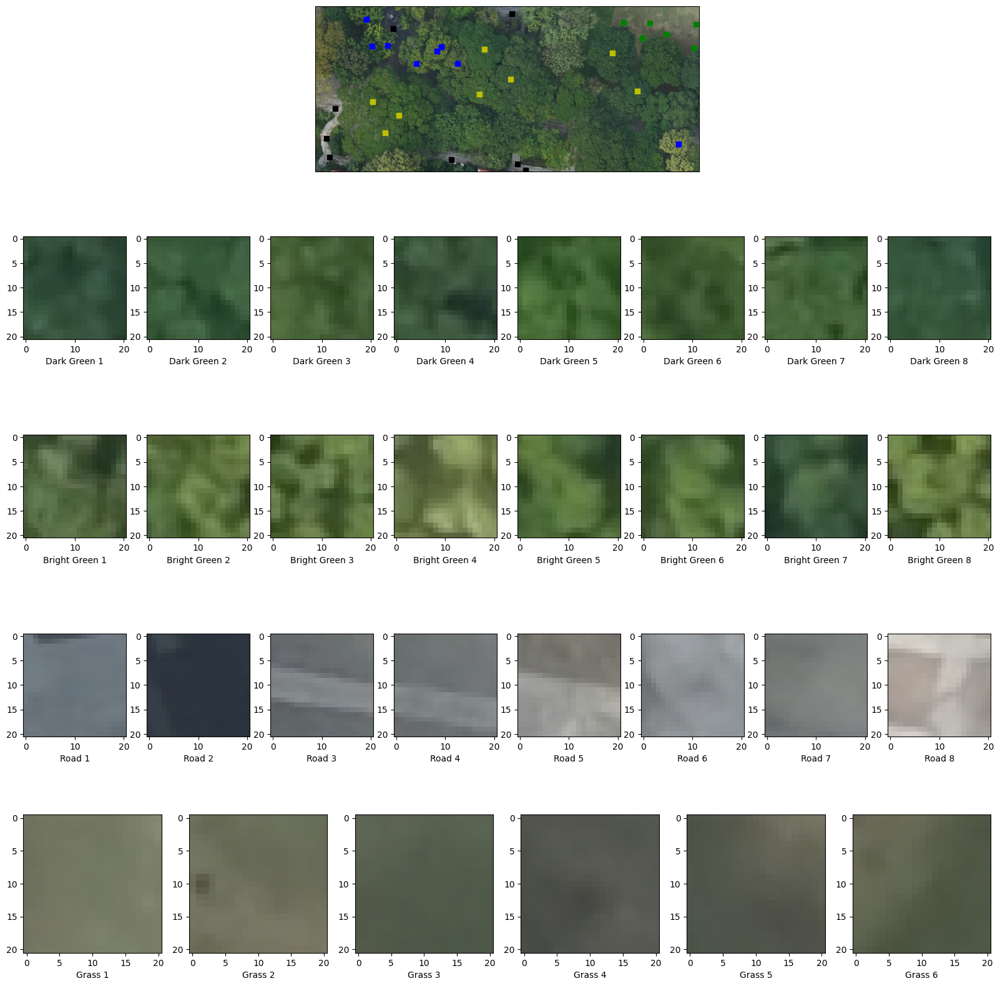

In [ ]:
# create the figure
fig = plt.figure(figsize=(20, 20))

# display original image with locations of patches
ax = fig.add_subplot(5, 1, 1)
ax.imshow(img[:,:,:3], vmin=0, vmax=255)

for x,y in dark_locations:
    ax.plot(x + PATCH_SIZE / 2, y + PATCH_SIZE / 2, 'ys')
for x, y in bright_locations:
    ax.plot(x + PATCH_SIZE / 2, y + PATCH_SIZE / 2, 'bs')
for x, y in road_locations:
    ax.plot(x + PATCH_SIZE / 2, y + PATCH_SIZE / 2, 'ks')
for x, y in grass_locations:
    ax.plot(x + PATCH_SIZE / 2, y + PATCH_SIZE / 2, 'gs')

#ax.set_xlabel('Original Image')
ax.set_xticks([])
ax.set_yticks([])
ax.axis('image')


# display the image patches
for i, patch in enumerate(dark_patches):
    ax = fig.add_subplot(5, len(dark_patches), len(dark_patches) * 1 + i + 1)
    ax.imshow(patch,  vmin=0, vmax=255)
    ax.set_xlabel(f"Dark Green {i + 1}")

for i, patch in enumerate(bright_patches):
    ax = fig.add_subplot(5, len(bright_patches), len(bright_patches) * 2 + i + 1)
    ax.imshow(patch,  vmin=0, vmax=255)
    ax.set_xlabel(f"Bright Green {i + 1}")

for i, patch in enumerate(road_patches):
    ax = fig.add_subplot(5, len(road_patches), len(road_patches) * 3 + i + 1)
    ax.imshow(patch,  vmin=0, vmax=255)
    ax.set_xlabel(f"Road {i + 1}")

for i, patch in enumerate(grass_patches):
    ax = fig.add_subplot(5, len(grass_patches), len(grass_patches) * 4 + i + 1)
    ax.imshow(patch,  vmin=0, vmax=255)
    ax.set_xlabel(f"Grass {i + 1}")


# display the patches and plot
#fig.suptitle('Orthophoto with Sample Data', fontsize=14, y=1.05)
plt.tight_layout()
plt.show()

In [ ]:
df['value'] = [ feature for feature in IMG.sample( [(x,y) for x,y in zip(df.X, df.Y)] ) ]
mycol = [i for i in range(IMG.count) ]
df[ mycol ] = [x for x in list( df.value )]
df

,Y,X,label,col,row,value,0,1,2,3
0,1519270.021,665495.4271,0,1699,261,"[45, 73, 54, 255]",45,73,54,255
1,1519271.398,665453.2102,0,964,237,"[47, 81, 49, 255]",47,81,49,255
2,1519243.751,665420.4003,0,392,718,"[53, 78, 39, 255]",53,78,39,255
3,1519261.360,665461.7568,0,1112,412,"[59, 84, 62, 255]",59,84,62,255
4,1519249.441,665424.8852,0,470,619,"[57, 92, 43, 255]",57,92,43,255
5,1519254.077,665416.1616,0,318,538,"[57, 84, 46, 255]",57,84,46,255
6,1519256.410,665451.3762,0,932,498,"[57, 88, 46, 255]",57,88,46,255
7,1519257.463,665503.6414,0,1843,479,"[54, 87, 61, 255]",54,87,61,255
8,1519266.637,665444.3194,1,809,320,"[94, 112, 77, 255]",94,112,77,255
9,1519266.637,665430.7251,1,572,320,"[111, 136, 78, 255]",111,136,78,255


In [ ]:
df_play = df.copy()
listband = [i for i in range(3)]
x = df_play[ listband ]
y = df_play[ 'label' ]

In [ ]:
x

,0,1,2
0,45,73,54
1,47,81,49
2,53,78,39
3,59,84,62
4,57,92,43
5,57,84,46
6,57,88,46
7,54,87,61
8,94,112,77
9,111,136,78


In [ ]:
y

,label
0,0
1,0
2,0
3,0
4,0
5,0
6,0
7,0
8,1
9,1


In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix,classification_report
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split( x, y, test_size=0.5, random_state=42)
RFC = RandomForestClassifier(n_estimators=50)
RFC.fit(X_train, y_train)
y_pred = RFC.predict(X_test)
y_true = y_test.to_numpy()

print( confusion_matrix(y_true, y_pred) )
print( classification_report(y_true, y_pred) )

[[3 0 0 0]
 [0 2 2 2]
 [1 0 2 0]
 [1 0 0 2]]
              precision    recall  f1-score   support

           0       0.60      1.00      0.75         3
           1       1.00      0.33      0.50         6
           2       0.50      0.67      0.57         3
           3       0.50      0.67      0.57         3

    accuracy                           0.60        15
   macro avg       0.65      0.67      0.60        15
weighted avg       0.72      0.60      0.58        15



In [ ]:
RFC.get_params()

{'bootstrap': True,
 'ccp_alpha': 0.0,
 'class_weight': None,
 'criterion': 'gini',
 'max_depth': None,
 'max_features': 'sqrt',
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'monotonic_cst': None,
 'n_estimators': 50,
 'n_jobs': None,
 'oob_score': False,
 'random_state': None,
 'verbose': 0,
 'warm_start': False}

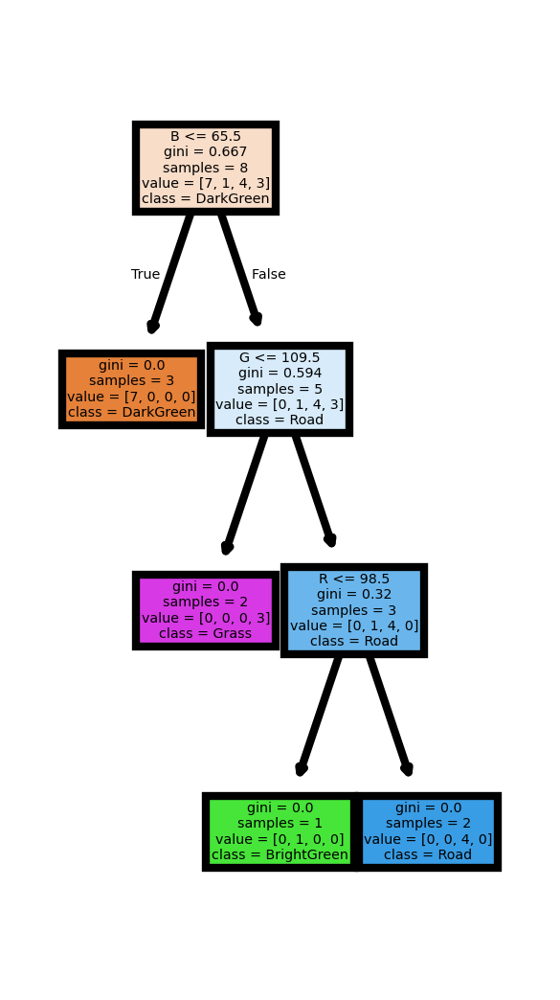

In [ ]:
fig, axes = plt.subplots(nrows = 1,ncols = 1,figsize = (1,2), dpi=600)

tree_id = 49 # <--- for i in range( len(n_estimator) )

tree.plot_tree(RFC.estimators_[tree_id],
               feature_names=['R','G','B'],
               class_names=['DarkGreen', 'BrightGreen', 'Road', 'Grass'], filled=True,rounded=False,)
fig.show()

In [ ]:
new_image = 'yokky_classy_RGB.tif'
old_image = 'yokky_crop1.tif'

In [ ]:
import numpy as np
with rio.open(old_image,'r') as src:
  profile = src.profile
  profile.update( dtype=rio.uint8, count=1)
  with rio.open(new_image, 'w', **profile) as dst:
    data = src.read([j+1 for j in listband])
    img_swp = np.moveaxis(data, 0, 2 )
    img_flat = img_swp.reshape(-1, img_swp.shape[-1])
    img_flat = np.nan_to_num( img_flat )
    img_preds = RFC.predict(img_flat)
    output = img_preds.reshape(*img_swp.shape[:-1])
    dst.write( output.astype(rio.uint8) , 1)

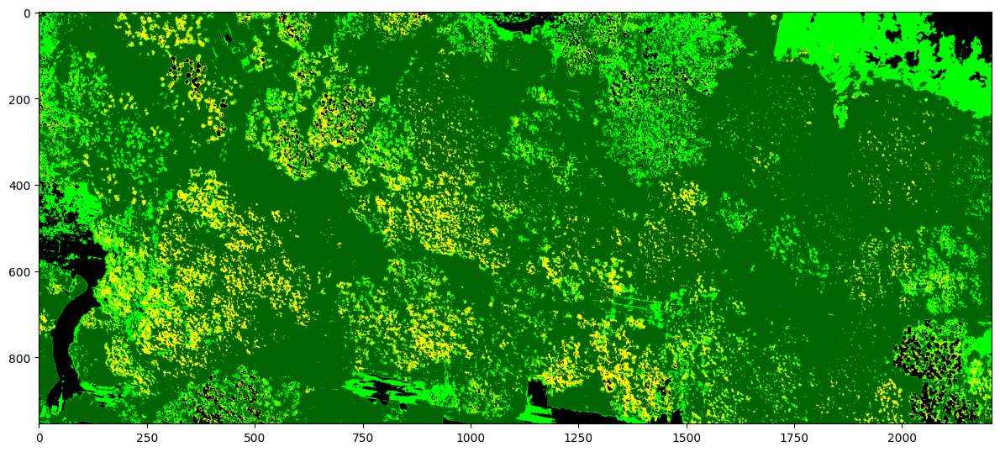

In [ ]:
out = rio.open(new_image)
classy_img = out.read()
from matplotlib import colors
fig = plt.figure(figsize=(12, 24))


cmap = colors.ListedColormap(['darkgreen','yellow','black','lime'])
bounds=[-0.5,0.5,1.5,2.5]
norm = colors.BoundaryNorm(bounds, cmap.N)
#fig = plt.figure(figsize=(16, 16))

# display original image with locations of patches

plt.imshow(classy_img[0], cmap=cmap )

plt.tight_layout()

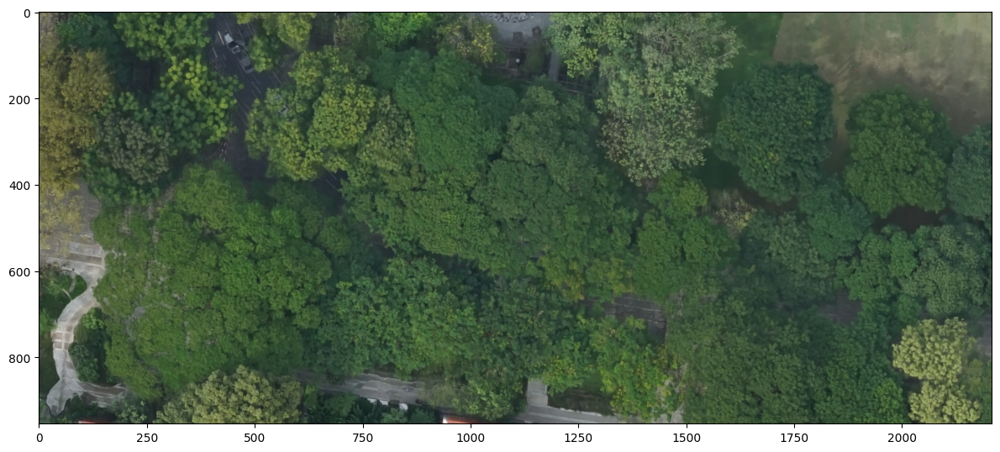

In [ ]:
from matplotlib import colors
fig = plt.figure(figsize=(12, 24))

ax = fig.add_subplot(2, 1, 1)
ax.imshow(img[:,:,:3], vmin=0, vmax=255)

plt.tight_layout()
plt.show()

# UAV Image Processing and Preparation

Fast Gray-Level Co-Occurrence Matrix (GLCM) by numpy. This script calculates GLCM without per pixel For loop, and works faster than GLCM on scikit-image.

https://github.com/tzm030329/GLCM

In [ ]:
myimg = io.imread( '/content/yokky_crop1.tif' )

In [ ]:
R =  myimg[:,:,0]

In [ ]:
G = myimg[:,:,1]

In [ ]:
B = myimg[:,:,2]

In [ ]:
GRVI = (G-R)/(G+R)
GLI = (2*G - R + B)/(2*G + R + B)
RGBVI = (G**2 - B*R)/(G**2 + B*R)
TGI = G - 0.39*R - 0.61*B
VARI = (G-R)/(G+R-B)

<ipython-input-29-d9af8a44e8b8>:1: RuntimeWarning: divide by zero encountered in divide
  GRVI = (G-R)/(G+R)
<ipython-input-29-d9af8a44e8b8>:1: RuntimeWarning: invalid value encountered in divide
  GRVI = (G-R)/(G+R)
<ipython-input-29-d9af8a44e8b8>:2: RuntimeWarning: divide by zero encountered in divide
  GLI = (2*G - R + B)/(2*G + R + B)
<ipython-input-29-d9af8a44e8b8>:2: RuntimeWarning: invalid value encountered in divide
  GLI = (2*G - R + B)/(2*G + R + B)
<ipython-input-29-d9af8a44e8b8>:3: RuntimeWarning: divide by zero encountered in divide
  RGBVI = (G**2 - B*R)/(G**2 + B*R)
<ipython-input-29-d9af8a44e8b8>:3: RuntimeWarning: invalid value encountered in divide
  RGBVI = (G**2 - B*R)/(G**2 + B*R)
<ipython-input-29-d9af8a44e8b8>:5: RuntimeWarning: divide by zero encountered in divide
  VARI = (G-R)/(G+R-B)


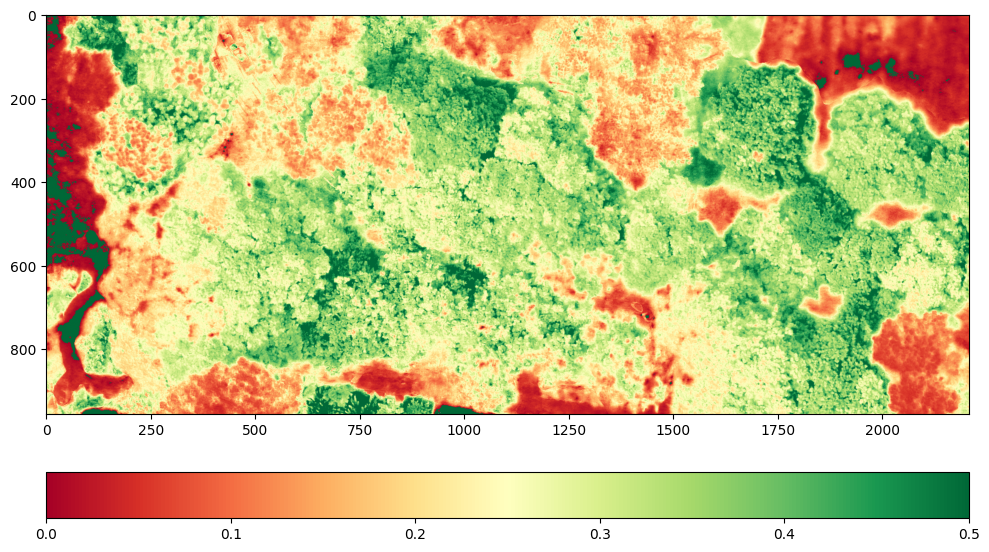

In [ ]:
from matplotlib import colors
fig = plt.figure(figsize=(10, 12))

plt.imshow(  VARI , cmap='RdYlGn' , vmin=0, vmax=0.5)
plt.colorbar(location='bottom', pad=0.05)
plt.tight_layout()

In [ ]:
# coding: utf-8

import numpy as np
import matplotlib.pyplot as plt
import cv2
from skimage import data
from skimage import exposure, io

def fast_glcm(img, vmin=0, vmax=255, levels=8, kernel_size=5, distance=1.0, angle=0.0):
    '''
    Parameters
    ----------
    img: array_like, shape=(h,w), dtype=np.uint8
        input image
    vmin: int
        minimum value of input image
    vmax: int
        maximum value of input image
    levels: int
        number of grey-levels of GLCM
    kernel_size: int
        Patch size to calculate GLCM around the target pixel
    distance: float
        pixel pair distance offsets [pixel] (1.0, 2.0, and etc.)
    angle: float
        pixel pair angles [degree] (0.0, 30.0, 45.0, 90.0, and etc.)

    Returns
    -------
    Grey-level co-occurrence matrix for each pixels
    shape = (levels, levels, h, w)
    '''

    mi, ma = vmin, vmax
    ks = kernel_size
    h,w = img.shape

    # digitize
    bins = np.linspace(mi, ma+1, levels+1)
    gl1 = np.digitize(img, bins) - 1

    # make shifted image
    dx = distance*np.cos(np.deg2rad(angle))
    dy = distance*np.sin(np.deg2rad(-angle))
    mat = np.array([[1.0,0.0,-dx], [0.0,1.0,-dy]], dtype=np.float32)
    gl2 = cv2.warpAffine(gl1, mat, (w,h), flags=cv2.INTER_NEAREST,
                         borderMode=cv2.BORDER_REPLICATE)

    # make glcm

    # Find the position that change from i to j
    glcm = np.zeros((levels, levels, h, w), dtype=np.uint8)
    for i in range(levels):
        for j in range(levels):
            mask = ((gl1==i) & (gl2==j))
            glcm[i,j, mask] = 1

    # Count the position that change from i to j in specific kernel size
    kernel = np.ones((ks, ks), dtype=np.uint8)
    for i in range(levels):
        for j in range(levels):
            glcm[i,j] = cv2.filter2D(glcm[i,j], -1, kernel)

    glcm = glcm.astype(np.float32)
    return glcm


def fast_glcm_mean(img, vmin=0, vmax=255, levels=8, ks=5, distance=1.0, angle=0.0):
    '''
    calc glcm mean
    '''
    h,w = img.shape
    glcm = fast_glcm(img, vmin, vmax, levels, ks, distance, angle)
    mean = np.zeros((h,w), dtype=np.float32)
    for i in range(levels):
        for j in range(levels):
            mean += glcm[i,j] * i / (levels)**2

    return mean


def fast_glcm_std(img, vmin=0, vmax=255, levels=8, ks=5, distance=1.0, angle=0.0):
    '''
    calc glcm std
    '''
    h,w = img.shape
    glcm = fast_glcm(img, vmin, vmax, levels, ks, distance, angle)
    mean = np.zeros((h,w), dtype=np.float32)
    for i in range(levels):
        for j in range(levels):
            mean += glcm[i,j] * i / (levels)**2

    std2 = np.zeros((h,w), dtype=np.float32)
    for i in range(levels):
        for j in range(levels):
            std2 += (glcm[i,j] * i - mean)**2

    std = np.sqrt(std2)
    return std


def fast_glcm_contrast(img, vmin=0, vmax=255, levels=8, ks=5, distance=1.0, angle=0.0):
    '''
    calc glcm contrast
    '''
    h,w = img.shape
    glcm = fast_glcm(img, vmin, vmax, levels, ks, distance, angle)
    cont = np.zeros((h,w), dtype=np.float32)
    for i in range(levels):
        for j in range(levels):
            cont += glcm[i,j] * (i-j)**2

    return cont


def fast_glcm_dissimilarity(img, vmin=0, vmax=255, levels=8, ks=5, distance=1.0, angle=0.0):
    '''
    calc glcm dissimilarity
    '''
    h,w = img.shape
    glcm = fast_glcm(img, vmin, vmax, levels, ks, distance, angle)
    diss = np.zeros((h,w), dtype=np.float32)
    for i in range(levels):
        for j in range(levels):
            diss += glcm[i,j] * np.abs(i-j)

    return diss


def fast_glcm_homogeneity(img, vmin=0, vmax=255, levels=8, ks=5, distance=1.0, angle=0.0):
    '''
    calc glcm homogeneity
    '''
    h,w = img.shape
    glcm = fast_glcm(img, vmin, vmax, levels, ks, distance, angle)
    homo = np.zeros((h,w), dtype=np.float32)
    for i in range(levels):
        for j in range(levels):
            homo += glcm[i,j] / (1.+(i-j)**2)

    return homo


def fast_glcm_ASM(img, vmin=0, vmax=255, levels=8, ks=5, distance=1.0, angle=0.0):
    '''
    calc glcm asm, energy
    '''
    h,w = img.shape
    glcm = fast_glcm(img, vmin, vmax, levels, ks, distance, angle)
    asm = np.zeros((h,w), dtype=np.float32)
    for i in range(levels):
        for j in range(levels):
            asm  += glcm[i,j]**2

    ene = np.sqrt(asm)
    return asm, ene


def fast_glcm_max(img, vmin=0, vmax=255, levels=8, ks=5, distance=1.0, angle=0.0):
    '''
    calc glcm max
    '''
    glcm = fast_glcm(img, vmin, vmax, levels, ks, distance, angle)
    max_  = np.max(glcm, axis=(0,1))
    return max_


def fast_glcm_entropy(img, vmin=0, vmax=255, levels=8, ks=5, distance=1.0, angle=0.0):
    '''
    calc glcm entropy
    '''
    glcm = fast_glcm(img, vmin, vmax, levels, ks, distance, angle)
    pnorm = glcm / np.sum(glcm, axis=(0,1)) + 1./ks**2
    ent  = np.sum(-pnorm * np.log(pnorm), axis=(0,1))
    return ent


In [ ]:
h,w = R.shape
mean = fast_glcm_mean(R)
std = fast_glcm_std(R)
cont = fast_glcm_contrast(R)
diss = fast_glcm_dissimilarity(R)
homo = fast_glcm_homogeneity(R)
asm, ene = fast_glcm_ASM(R)
ma = fast_glcm_max(R)
ent = fast_glcm_entropy(R)

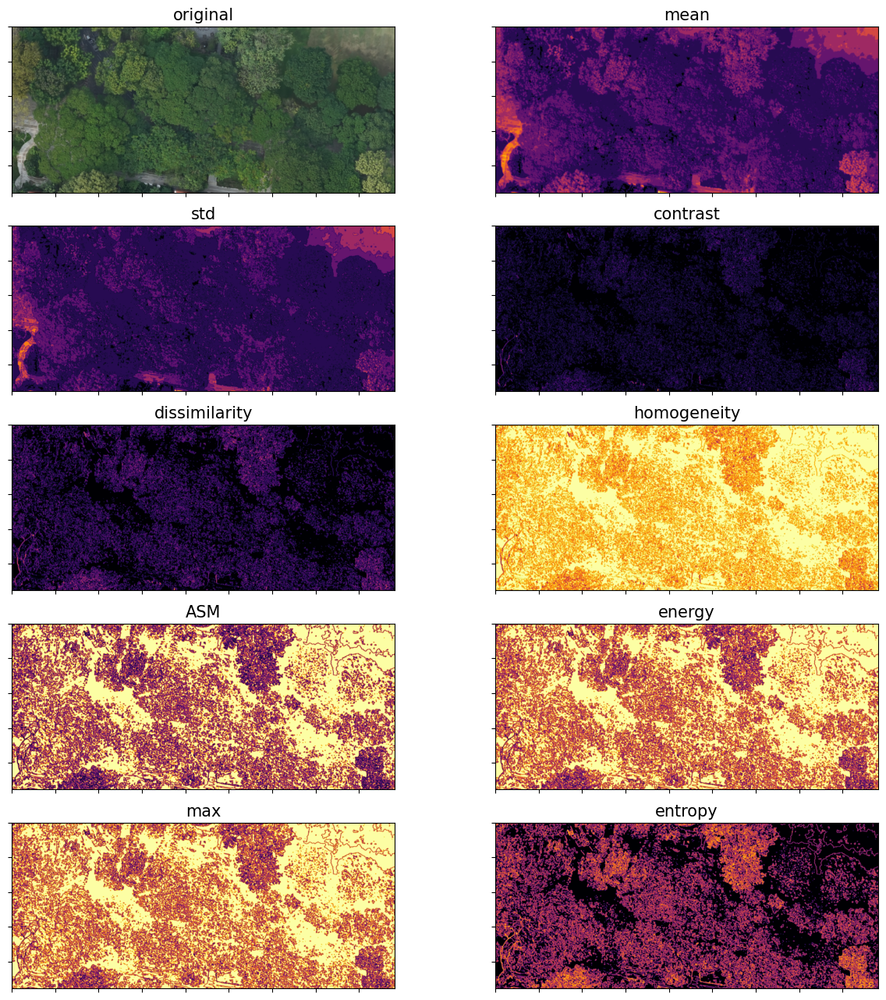

In [ ]:
    import matplotlib.pyplot as plt
    import matplotlib.gridspec as gridspec

    plt.figure(figsize=(16,16))
    gs1 = gridspec.GridSpec(5, 2)
    gs1.update(wspace=0, hspace=0.2) # set the spacing between axes.

    #plt.rcParams['image.cmap'] = 'inferno'
    fs = 15
    #plt.subplot(5,2,1)
    ax=plt.subplot(gs1[0])
    plt.axis('on')
    plt.tick_params(labelbottom=False, labelleft=False)
    plt.imshow(img, cmap='inferno')
    ax.set_aspect('equal')
    plt.title('original', fontsize=fs)

    #plt.subplot(5,2,2)
    ax=plt.subplot(gs1[1])
    plt.axis('on')
    plt.tick_params(labelbottom=False, labelleft=False)
    plt.imshow(mean, cmap='inferno')
    ax.set_aspect('equal')
    plt.title('mean', fontsize=fs)

    #plt.subplot(5,2,3)
    ax=plt.subplot(gs1[2])
    plt.axis('on')
    plt.tick_params(labelbottom=False, labelleft=False)
    plt.imshow(std, cmap='inferno')
    ax.set_aspect('equal')
    plt.title('std', fontsize=fs)

    #plt.subplot(5,2,4)
    ax=plt.subplot(gs1[3])
    plt.axis('on')
    plt.tick_params(labelbottom=False, labelleft=False)
    plt.imshow(cont, cmap='inferno')
    ax.set_aspect('equal')
    plt.title('contrast', fontsize=fs)

    #plt.subplot(5,2,5)
    ax=plt.subplot(gs1[4])
    plt.axis('on')
    plt.tick_params(labelbottom=False, labelleft=False)
    plt.imshow(diss, cmap='inferno')
    ax.set_aspect('equal')
    plt.title('dissimilarity', fontsize=fs)

    #plt.subplot(5,2,6)
    ax=plt.subplot(gs1[5])
    plt.axis('on')
    plt.tick_params(labelbottom=False, labelleft=False)
    plt.imshow(homo, cmap='inferno')
    ax.set_aspect('equal')
    plt.title('homogeneity', fontsize=fs)

    #plt.subplot(5,2,7)
    ax=plt.subplot(gs1[6])
    plt.axis('on')
    plt.tick_params(labelbottom=False, labelleft=False)
    plt.imshow(asm, cmap='inferno')
    ax.set_aspect('equal')
    plt.title('ASM', fontsize=fs)

    #plt.subplot(5,2,8)
    ax=plt.subplot(gs1[7])
    plt.axis('on')
    plt.tick_params(labelbottom=False, labelleft=False)
    plt.imshow(ene, cmap='inferno')
    ax.set_aspect('equal')
    plt.title('energy', fontsize=fs)

    #plt.subplot(5,2,9)
    ax=plt.subplot(gs1[8])
    plt.axis('on')
    plt.tick_params(labelbottom=False, labelleft=False)
    plt.imshow(ma, cmap='inferno')
    ax.set_aspect('equal')
    plt.title('max', fontsize=fs)

    #plt.subplot(5,2,10)
    ax=plt.subplot(gs1[9])
    plt.axis('on')
    plt.tick_params(labelbottom=False, labelleft=False)
    plt.imshow(ent, cmap='inferno')
    ax.set_aspect('equal')
    plt.title('entropy', fontsize=fs)

    #plt.tight_layout(pad=0.5)
    #plt.subplots_adjust(wspace=0, hspace=0)
    plt.savefig('output.jpg')
    plt.show()

In [ ]:
old_image = '/content/yokky_crop1.tif'
feature_image = '/content/yokky_feature_ALL.tif'

In [ ]:
# Reject energy ... because we already have ASM  ... energy = sqrt( ASM )

import numpy as np
import rasterio as rio
with rio.open(old_image,'r') as src:
  profile = src.profile
  profile.update(dtype=rio.float32, count=16)
  with rio.open(feature_image, 'w', **profile) as dst:
    data = src.read([1])  # Select Band Blue Only ...
    data = data[0]

    dst.write( ( src.read([1]) )[0] , 1 ) # Red
    dst.write( ( src.read([2]) )[0],  2 ) # Green
    dst.write( ( src.read([3]) )[0],  3 ) # Blue
    dst.write( GRVI, 4)
    dst.write( GLI, 5)
    dst.write( RGBVI, 6)
    dst.write( TGI, 7)
    dst.write( VARI, 8)

    dst.write( mean, 9 )
    dst.write( std, 10 )
    dst.write( cont, 11 )
    dst.write( diss, 12 )
    dst.write( homo, 13 )
    dst.write( asm, 14 )
    dst.write( ma, 15 )
    dst.write( ent, 16 )

In [ ]:
df_BIG = df.copy()
df_BIG

,Y,X,label,col,row,value,0,1,2,3
0,1519270.021,665495.4271,0,1699,261,"[45, 73, 54, 255]",45,73,54,255
1,1519271.398,665453.2102,0,964,237,"[47, 81, 49, 255]",47,81,49,255
2,1519243.751,665420.4003,0,392,718,"[53, 78, 39, 255]",53,78,39,255
3,1519261.360,665461.7568,0,1112,412,"[59, 84, 62, 255]",59,84,62,255
4,1519249.441,665424.8852,0,470,619,"[57, 92, 43, 255]",57,92,43,255
5,1519254.077,665416.1616,0,318,538,"[57, 84, 46, 255]",57,84,46,255
6,1519256.410,665451.3762,0,932,498,"[57, 88, 46, 255]",57,88,46,255
7,1519257.463,665503.6414,0,1843,479,"[54, 87, 61, 255]",54,87,61,255
8,1519266.637,665444.3194,1,809,320,"[94, 112, 77, 255]",94,112,77,255
9,1519266.637,665430.7251,1,572,320,"[111, 136, 78, 255]",111,136,78,255


In [ ]:
IMGG = rio.open(feature_image)

In [ ]:
df_BIG['value'] = [ feature for feature in IMGG.sample( [(x,y) for x,y in zip(df_BIG.X, df_BIG.Y)] ) ]
mycol = [i for i in range(IMGG.count) ]
df_BIG[ mycol ] = [x for x in list( df_BIG.value )]
df_BIG

,Y,X,label,col,row,value,0,1,2,3,...,6,7,8,9,10,11,12,13,14,15
0,1519270.021,665495.4271,0,1699,261,"[45.0, 73.0, 54.0, 0.23728813, 0.63265306, 1.0...",45.0,73.0,54.0,0.237288,...,22.510000,0.437500,0.390625,24.803919,0.0,0.0,25.0,625.0,25.0,8.070781
1,1519271.398,665453.2102,0,964,237,"[47.0, 81.0, 49.0, 0.265625, 82.0, 1.0125, 32....",47.0,81.0,49.0,0.265625,...,32.779999,0.430380,0.390625,24.803919,0.0,0.0,25.0,625.0,25.0,8.070781
2,1519243.751,665420.4003,0,392,718,"[53.0, 78.0, 39.0, 0.1908397, 0.57258064, 0.82...",53.0,78.0,39.0,0.190840,...,33.540001,0.271739,0.406250,22.878756,2.0,2.0,24.0,531.0,23.0,8.297364
3,1519261.360,665461.7568,0,1112,412,"[59.0, 84.0, 62.0, 0.17482518, 5.181818, 0.321...",59.0,84.0,62.0,0.174825,...,23.170000,0.308642,0.437500,19.435791,4.0,4.0,23.0,375.0,19.0,8.653521
4,1519249.441,665424.8852,0,470,619,"[57.0, 92.0, 43.0, 0.23489933, 6.071429, 0.766...",57.0,92.0,43.0,0.234899,...,43.540001,0.330189,0.531250,19.285681,5.0,5.0,22.5,231.0,13.0,8.962263
5,1519254.077,665416.1616,0,318,538,"[57.0, 84.0, 46.0, 0.19148937, 10.466666, 0.39...",57.0,84.0,46.0,0.191489,...,33.709999,0.284211,0.546875,18.051575,8.0,8.0,21.0,189.0,11.0,9.077811
6,1519256.410,665451.3762,0,932,498,"[57.0, 88.0, 46.0, 0.2137931, 7.173913, 0.0158...",57.0,88.0,46.0,0.213793,...,37.709999,0.313131,0.500000,18.547237,5.0,5.0,22.5,249.0,14.0,8.912173
7,1519257.463,665503.6414,0,1843,479,"[54.0, 87.0, 61.0, 0.23404256, 5.4848485, 1.61...",54.0,87.0,61.0,0.234043,...,28.730000,0.412500,0.390625,24.803919,0.0,0.0,25.0,625.0,25.0,8.070781
8,1519266.637,665444.3194,1,809,320,"[94.0, 112.0, 77.0, 0.08737864, 1.4892086, 2.6...",94.0,112.0,77.0,0.087379,...,28.370001,0.139535,0.781250,49.607838,0.0,0.0,25.0,625.0,25.0,8.070781
9,1519266.637,665430.7251,1,572,320,"[111.0, 136.0, 78.0, 0.10121457, 1.1658536, 6....",111.0,136.0,78.0,0.101215,...,45.130001,0.147929,1.125000,57.314919,3.0,3.0,23.5,379.0,19.0,8.618999


In [ ]:
df_playy = df_BIG.copy()
listband = [i for i in range(16)]
xx = df_playy[ listband ]
yy = df_playy[ 'label' ]

In [ ]:
xx

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15
0,45.0,73.0,54.0,0.237288,0.632653,1.050633,22.510000,0.437500,0.390625,24.803919,0.0,0.0,25.0,625.0,25.0,8.070781
1,47.0,81.0,49.0,0.265625,82.000000,1.012500,32.779999,0.430380,0.390625,24.803919,0.0,0.0,25.0,625.0,25.0,8.070781
2,53.0,78.0,39.0,0.190840,0.572581,0.823256,33.540001,0.271739,0.406250,22.878756,2.0,2.0,24.0,531.0,23.0,8.297364
3,59.0,84.0,62.0,0.174825,5.181818,0.321101,23.170000,0.308642,0.437500,19.435791,4.0,4.0,23.0,375.0,19.0,8.653521
4,57.0,92.0,43.0,0.234899,6.071429,0.766871,43.540001,0.330189,0.531250,19.285681,5.0,5.0,22.5,231.0,13.0,8.962263
5,57.0,84.0,46.0,0.191489,10.466666,0.398058,33.709999,0.284211,0.546875,18.051575,8.0,8.0,21.0,189.0,11.0,9.077811
6,57.0,88.0,46.0,0.213793,7.173913,0.015873,37.709999,0.313131,0.500000,18.547237,5.0,5.0,22.5,249.0,14.0,8.912173
7,54.0,87.0,61.0,0.234043,5.484848,1.612613,28.730000,0.412500,0.390625,24.803919,0.0,0.0,25.0,625.0,25.0,8.070781
8,94.0,112.0,77.0,0.087379,1.489209,2.657143,28.370001,0.139535,0.781250,49.607838,0.0,0.0,25.0,625.0,25.0,8.070781
9,111.0,136.0,78.0,0.101215,1.165854,6.111111,45.130001,0.147929,1.125000,57.314919,3.0,3.0,23.5,379.0,19.0,8.618999


In [ ]:
yy

,label
0,0
1,0
2,0
3,0
4,0
5,0
6,0
7,0
8,1
9,1


In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix,classification_report
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split

XX_train, XX_test, yy_train, yy_test = train_test_split( xx, yy, test_size=0.5, random_state=42)
clf = RandomForestClassifier(n_estimators=50)
clf.fit(XX_train, yy_train)
yy_pred = clf.predict(XX_test)
yy_true = yy_test.to_numpy()

print( confusion_matrix(yy_true, yy_pred) )
print( classification_report(yy_true, yy_pred) )

[[3 0 0 0]
 [0 4 1 1]
 [1 0 2 0]
 [0 0 0 3]]
              precision    recall  f1-score   support

           0       0.75      1.00      0.86         3
           1       1.00      0.67      0.80         6
           2       0.67      0.67      0.67         3
           3       0.75      1.00      0.86         3

    accuracy                           0.80        15
   macro avg       0.79      0.83      0.80        15
weighted avg       0.83      0.80      0.80        15



In [ ]:
new_image = '/content/yokky_classy_ALL.tif'

In [ ]:
feature_image = 'yokky_feature_ALL.tif'

In [ ]:
import numpy as np
with rio.open(feature_image,'r') as src:
  profile = src.profile
  profile.update( dtype=rio.uint8, count=1)
  with rio.open(new_image, 'w', **profile) as dst:
    data = src.read([j+1 for j in listband])
    img_swp = np.moveaxis(data, 0, 2 )
    img_flat = img_swp.reshape(-1, img_swp.shape[-1])
    img_flat = np.nan_to_num( img_flat )
    img_preds = clf.predict(img_flat)
    output = img_preds.reshape(*img_swp.shape[:-1])
    dst.write( output.astype(rio.uint8) , 1)

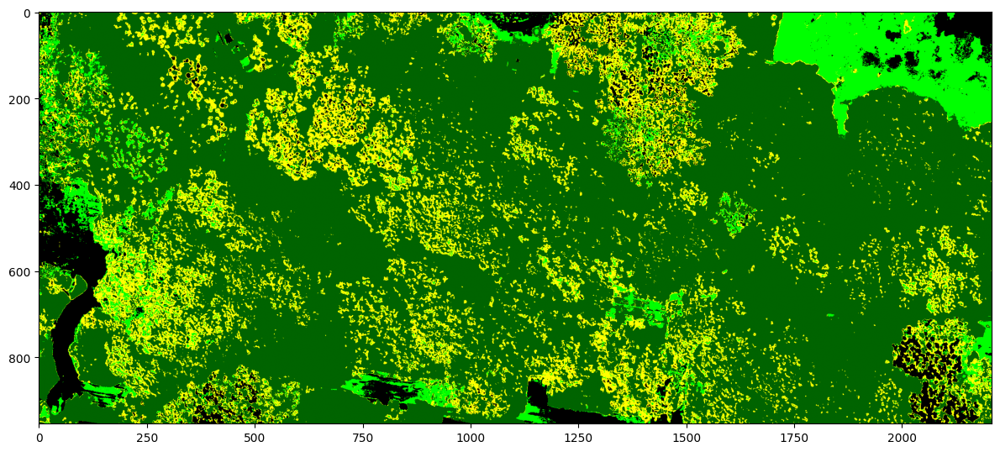

In [ ]:
out = rio.open(new_image)
yokky_img = out.read()
from matplotlib import colors
fig = plt.figure(figsize=(12, 24))


cmap = colors.ListedColormap(['darkgreen','yellow','black','lime'])
bounds=[-0.5,0.5,1.5,2.5]
norm = colors.BoundaryNorm(bounds, cmap.N)
#fig = plt.figure(figsize=(16, 16))

# display original image with locations of patches

plt.imshow(yokky_img[0], cmap=cmap )

plt.tight_layout()

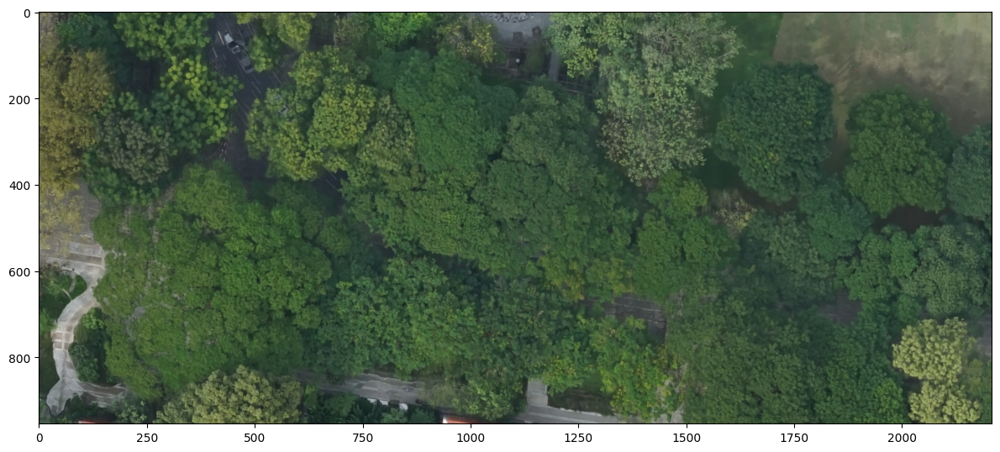

In [ ]:
from matplotlib import colors
fig = plt.figure(figsize=(12, 24))

ax = fig.add_subplot(2, 1, 1)
ax.imshow(img[:,:,:3], vmin=0, vmax=255)

plt.tight_layout()
plt.show()